In [1]:
!apt-get install unrar

# Upgrade pip (optional, but recommended)
!pip install --upgrade pip

# Install PyTorch. Colab usually has PyTorch pre-installed.
!pip install torch torchvision

# Install Hugging Face Transformers
!pip install transformers

# Install the PEFT library for parameter-efficient fine-tuning
!pip install peft

# Install the Hugging Face Datasets library
!pip install datasets

# Install the Evaluate library for computing metrics
!pip install evaluate

# Install Pillow (for working with images)
!pip install Pillow

# (Optional) Install NumPy if not installed - Colab comes with it pre-installed.
!pip install numpy

!pip install rouge_score
!pip install evaluate
!pip install clip-score


Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
unrar is already the newest version (1:6.1.5-1ubuntu0.1).
0 upgraded, 0 newly installed, 0 to remove and 30 not upgraded.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 77.2 MB/s eta 0:00:00
  Attempting uninstall: pip
    Found existing installation: pip 24.1.2
    Uninstalling pip-24.1.2:
      Successfully uninstalled pip-24.1.2
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 61.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 185.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 204.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 56.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 38.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 150.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 164.9 MB/s eta 0:00:

In [2]:
#dataset
! gdown --id 1tOQTqYzCMRKGu1odehjFa0N11o1cbvKQ

/usr/local/lib/python3.11/dist-packages/gdown/__main__.py:140: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From: https://drive.google.com/uc?id=1tOQTqYzCMRKGu1odehjFa0N11o1cbvKQ
To: /content/test-00000-of-00001.parquet
100% 96.3M/96.3M [00:02<00:00, 46.6MB/s]


In [3]:
! gdown --id 1Eiuiqx_qn4oEw4GQja1TG5QlYGXrRe_T

/usr/local/lib/python3.11/dist-packages/gdown/__main__.py:140: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From (original): https://drive.google.com/uc?id=1Eiuiqx_qn4oEw4GQja1TG5QlYGXrRe_T
From (redirected): https://drive.google.com/uc?id=1Eiuiqx_qn4oEw4GQja1TG5QlYGXrRe_T&confirm=t&uuid=05c9cf36-9d88-4289-8d70-79100d2b9345
To: /content/Alharthi_Reduced1-nolora-instructblip-advanced-finetized-final.zip
100% 291M/291M [00:07<00:00, 38.5MB/s]


In [5]:


!unzip Alharthi_Reduced1-nolora-instructblip-advanced-finetized-final.zip -d Alharthi_Reduced1_nolora

Archive:  Alharthi_Reduced1-nolora-instructblip-advanced-finetized-final.zip
   creating: Alharthi_Reduced1_nolora/qformer_tokenizer/
  inflating: Alharthi_Reduced1_nolora/preprocessor_config.json  
  inflating: Alharthi_Reduced1_nolora/tokenizer_config.json  
  inflating: Alharthi_Reduced1_nolora/adapter_model.safetensors  
  inflating: Alharthi_Reduced1_nolora/training_args.bin  
  inflating: Alharthi_Reduced1_nolora/special_tokens_map.json  
  inflating: Alharthi_Reduced1_nolora/tokenizer.json  
  inflating: Alharthi_Reduced1_nolora/tokenizer.model  
  inflating: Alharthi_Reduced1_nolora/processor_config.json  
  inflating: Alharthi_Reduced1_nolora/added_tokens.json  
  inflating: Alharthi_Reduced1_nolora/README.md  
  inflating: Alharthi_Reduced1_nolora/adapter_config.json  
  inflating: Alharthi_Reduced1_nolora/qformer_tokenizer/tokenizer_config.json  
  inflating: Alharthi_Reduced1_nolora/qformer_tokenizer/special_tokens_map.json  
  inflating: Alharthi_Reduced1_nolora/qformer_to

In [6]:
import torch
from transformers import InstructBlipProcessor, InstructBlipForConditionalGeneration, CLIPProcessor, CLIPModel
from peft import PeftModel
from datasets import load_dataset
from tqdm import tqdm
import random
from PIL import Image
import evaluate  # For ROUGE

# --- Configuration ---
base_model_name = "Alharthi_Reduced1_nolora"
adapter_path = "Alharthi_Reduced1_nolora"
data_path = "test-00000-of-00001.parquet"
start_idx = 1001  # Start index for test loss and metrics

# --- Load Model, Adapter, Processor for InstructBlip ---
print("Loading model, adapter, and processor...")
model = InstructBlipForConditionalGeneration.from_pretrained(
    base_model_name,
    torch_dtype=torch.float16,
)
model = PeftModel.from_pretrained(model, adapter_path)
processor = InstructBlipProcessor.from_pretrained(adapter_path, use_fast=True)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)
model.eval()
model.config.use_cache = False

# --- Load Dataset ---
print("Loading dataset...")
dataset = load_dataset('parquet', data_files=data_path)['train']
total_samples = len(dataset)
print(f"Total samples: {total_samples}")


Loading model, adapter, and processor...


/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/1.24k [00:00<?, ?B/s]

model.safetensors.index.json:   0%|          | 0.00/104k [00:00<?, ?B/s]

Fetching 4 files:   0%|          | 0/4 [00:00<?, ?it/s]

model-00002-of-00004.safetensors:   0%|          | 0.00/9.96G [00:00<?, ?B/s]

model-00001-of-00004.safetensors:   0%|          | 0.00/9.90G [00:00<?, ?B/s]

model-00004-of-00004.safetensors:   0%|          | 0.00/1.88G [00:00<?, ?B/s]

model-00003-of-00004.safetensors:   0%|          | 0.00/9.92G [00:00<?, ?B/s]

Loading checkpoint shards:   0%|          | 0/4 [00:00<?, ?it/s]

generation_config.json:   0%|          | 0.00/141 [00:00<?, ?B/s]

Loading dataset...


Generating train split: 0 examples [00:00, ? examples/s]

Total samples: 1250


Evaluating samples for loss: 100%|██████████| 249/249 [00:41<00:00,  5.98it/s]
Truncation was not explicitly activated but `max_length` is provided a specific value, please use `truncation=True` to explicitly truncate examples to max length. Defaulting to 'longest_first' truncation strategy. If you encode pairs of sequences (GLUE-style) with the tokenizer you can select this strategy more precisely by providing a specific strategy to `truncation`.
Truncation was not explicitly activated but `max_length` is provided a specific value, please use `truncation=True` to explicitly truncate examples to max length. Defaulting to 'longest_first' truncation strategy. If you encode pairs of sequences (GLUE-style) with the tokenizer you can select this strategy more precisely by providing a specific strategy to `truncation`.



Average Loss over 249 samples (from 1001 to end): 5.6740

Running inference on a random sample...

--------------------------------------------------
INPUT (Query): Describe this image in detail.
--------------------------------------------------
ACTUAL OUTPUT: ['The image features a large farm carriage led by a team of six horses, arranged in rows. The carriage displays the words "Double M Farms" on it, indicating its affiliation with a farm. The horses are standing in the street, arranged in pairs, with some closer to the front.\n\nThere are three people visible in the scene. Two of them are on top of the carriage, possibly managing the horses or enjoying a ride, while the third person is standing further back, most likely observing the carriage and its team of horses.', 'The image features a large farm carriage led by a team of six horses, arranged in rows. The carriage displays the words "Double M Farms" on it, indicating its affiliation with a farm. The horses are standing in the

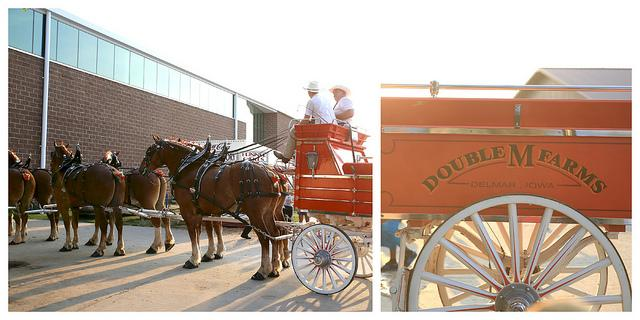

In [7]:

# --- Compute Average Loss over Test Samples ---
total_loss = 0.0
num_samples = 0

for idx in tqdm(range(start_idx, total_samples), desc="Evaluating samples for loss"):
    sample = dataset[idx]
    image = sample['image']
    query = sample['query']
    actual_response = sample['response']

    # Prepare inputs for loss computation
    inputs = processor(
        images=image,
        text=query,
        return_tensors="pt",
        padding="max_length",
        truncation=True,
        max_length=512,
    ).to(device, torch.float16)

    # Process target; if list, use first element.
    target = processor(
        text=actual_response if not isinstance(actual_response, list) else actual_response[0],
        return_tensors="pt",
        padding="max_length",
        truncation=True,
        max_length=512,
    ).input_ids.to(device)

    # Adjust target length if necessary.
    if target.shape[1] == 512:
        target = target[:, :511]

    inputs["labels"] = target

    with torch.no_grad():
        outputs = model(**inputs)
        total_loss += outputs.loss.item()
        num_samples += 1

average_loss = total_loss / num_samples
print(f"\nAverage Loss over {num_samples} samples (from {start_idx} to end): {average_loss:.4f}")

# --- Random Sample Inference (as before) ---
print("\nRunning inference on a random sample...")
random_idx = random.randint(0, total_samples - 1)
sample = dataset[random_idx]
image = sample['image']
query = sample['query']
actual_response = sample['response']

inputs = processor(
    images=image,
    text=query,
    return_tensors="pt",
).to(device, torch.float16)

if 'qformer_input_ids' not in inputs:
    inputs['qformer_input_ids'] = inputs.input_ids.clone()
if 'qformer_attention_mask' not in inputs:
    inputs['qformer_attention_mask'] = inputs.attention_mask.clone()

with torch.no_grad():
    generated_ids = model.generate(
        pixel_values=inputs.pixel_values,
        input_ids=inputs.input_ids,
        attention_mask=inputs.attention_mask,
        qformer_input_ids=inputs.qformer_input_ids,
        qformer_attention_mask=inputs.qformer_attention_mask,
        max_new_tokens=128,
        num_beams=3,
        do_sample=False,
    )

input_length = inputs.input_ids.shape[1]
generated_ids_only = generated_ids[:, input_length:]
generated_text = processor.batch_decode(generated_ids_only, skip_special_tokens=True)[0].strip()

print("\n" + "-" * 50)
print(f"INPUT (Query): {query}")
print("-" * 50)
print(f"ACTUAL OUTPUT: {actual_response}")
print("-" * 50)
print(f"GENERATED OUTPUT: {generated_text}")
print("-" * 50)

if isinstance(image, Image.Image):
    display(image)
elif hasattr(image, 'numpy'):
    display(Image.fromarray(image.numpy()))
else:
    print("Image format not recognized.")



Running inference on 10 random samples between 1001 and 1250...

Sample 1 (Index 1058)
--------------------------------------------------
INPUT (Query): Why are the trees bare in this image?
--------------------------------------------------
ACTUAL OUTPUT: ['The trees in this picture look bare because the season is winter. The snow in the scene and the clothing on people suggest that the season should be winter, and most trees will lose their leaves during the winter.', 'The trees in this picture look bare because they are covered in snow. Snow can weigh down tree branches and cause leaves to stick to the branches, making the trees look desolate and wintery.']
--------------------------------------------------
GENERATED OUTPUT: The trees are bare in this image because it is winter, and the trees have lost their leaves due to the cold weather. This is a common phenomenon during the winter months, as trees shed their foliage to conserve energy and protect themselves from the harsh weath

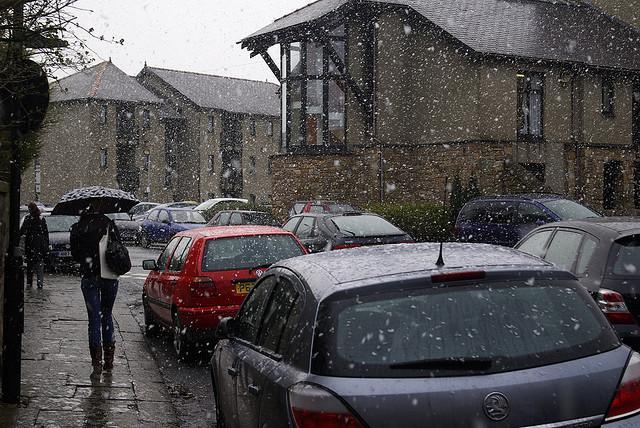


Sample 2 (Index 1056)
--------------------------------------------------
INPUT (Query): What kind of food is this?
--------------------------------------------------
ACTUAL OUTPUT: ['The food in the image appears to be bread and tater tots. The bread looks very fluffy, while the tater tots are small, deep-fried potato blocks. This combination is often a popular snack or meal choice for individuals of all ages.', 'The food in the image appears to be hot dogs and tater tots. Hot dogs are a type of sausage typically eaten in a bun, while the tater tots are small, deep-fried potato blocks. This combination is often a popular snack or meal choice for individuals of all ages.']
--------------------------------------------------
GENERATED OUTPUT: hot dogs and tater tots
--------------------------------------------------


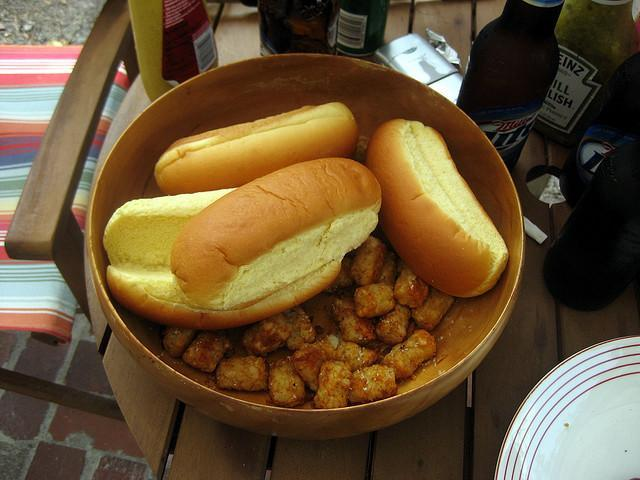


Sample 3 (Index 1204)
--------------------------------------------------
INPUT (Query): Describe the image.
--------------------------------------------------
ACTUAL OUTPUT: ['The image shows a city street with both sides lined with cars parked along the street. There are several people walking on the sidewalk and a few cars driving down the street. The street is wide and features a dividing line in the center. The buildings on the right side of the street are quite large, with one of them appearing to be an older building. The sky is blue and there are a few clouds scattered throughout the sky. Overall, the scene captures a typical busy city street with traffic and pedestrians.', 'The image captures a tranquil scene on a sunny day in a European city. The street, lined with trees on the left side, is a one-way road with cars parked neatly on the right. The buildings, painted in a variety of earthy tones, add a touch of warmth to the scene. One of the buildings in the background has a 

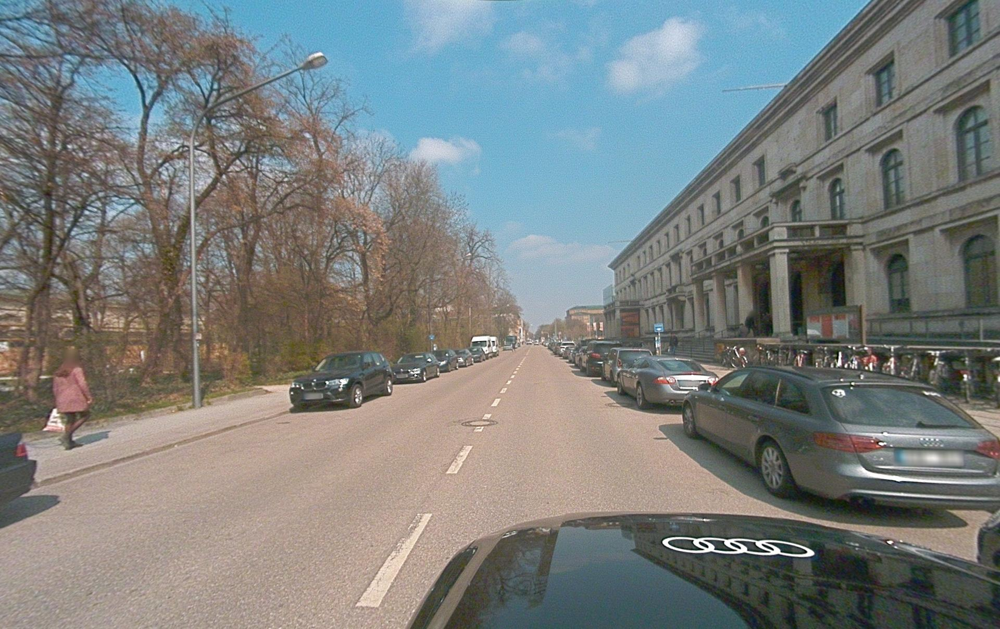


Sample 4 (Index 1109)
--------------------------------------------------
INPUT (Query): Would this woman's outfit be comfortable to climb many flights of stairs in? Would the item she's carrying be appropriate to bring to a meeting with a client?
--------------------------------------------------
ACTUAL OUTPUT: ["This woman's outfit would not be comfortable to climb many flights of stairs in. The pants are too tight and the shoes are too high. The item she's carrying would be appropriate to bring to a meeting with a client. It is a stylish and professional-looking bag.", "The woman's outfit, which includes a dress, heels, and a purse, is not the most comfortable choice for climbing many flights of stairs. Heels are not ideal for walking up stairs due to their height and the fact that they can easily slip on stairs. Additionally, the dress may not provide the most freedom of movement needed for climbing stairs.\n\nAs for the purse, it is not clear from the image whether it is a large o

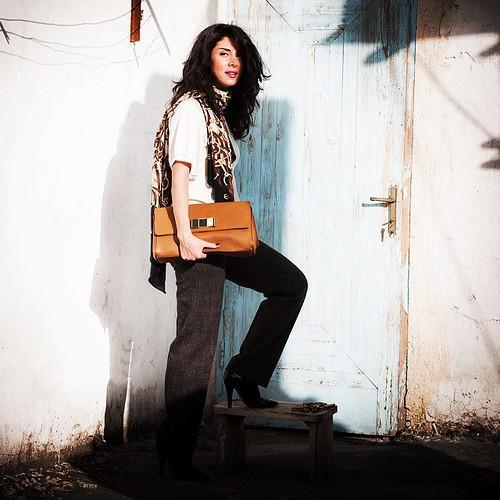


Sample 5 (Index 1093)
--------------------------------------------------
INPUT (Query): What city was this photograph taken in?
--------------------------------------------------
ACTUAL OUTPUT: ['Answer: The photograph was taken in Hong Kong.', 'The photograph appears to be taken in Hong Kong, as indicated by the distinctive skyline with the International Commerce Centre (ICC), which is the tallest building in the city, and the surrounding mountains. The stadium in the foreground is the Hong Kong Stadium, which is located in So Kon Po, Causeway Bay, Hong Kong.']
--------------------------------------------------
GENERATED OUTPUT: Los Angeles
--------------------------------------------------


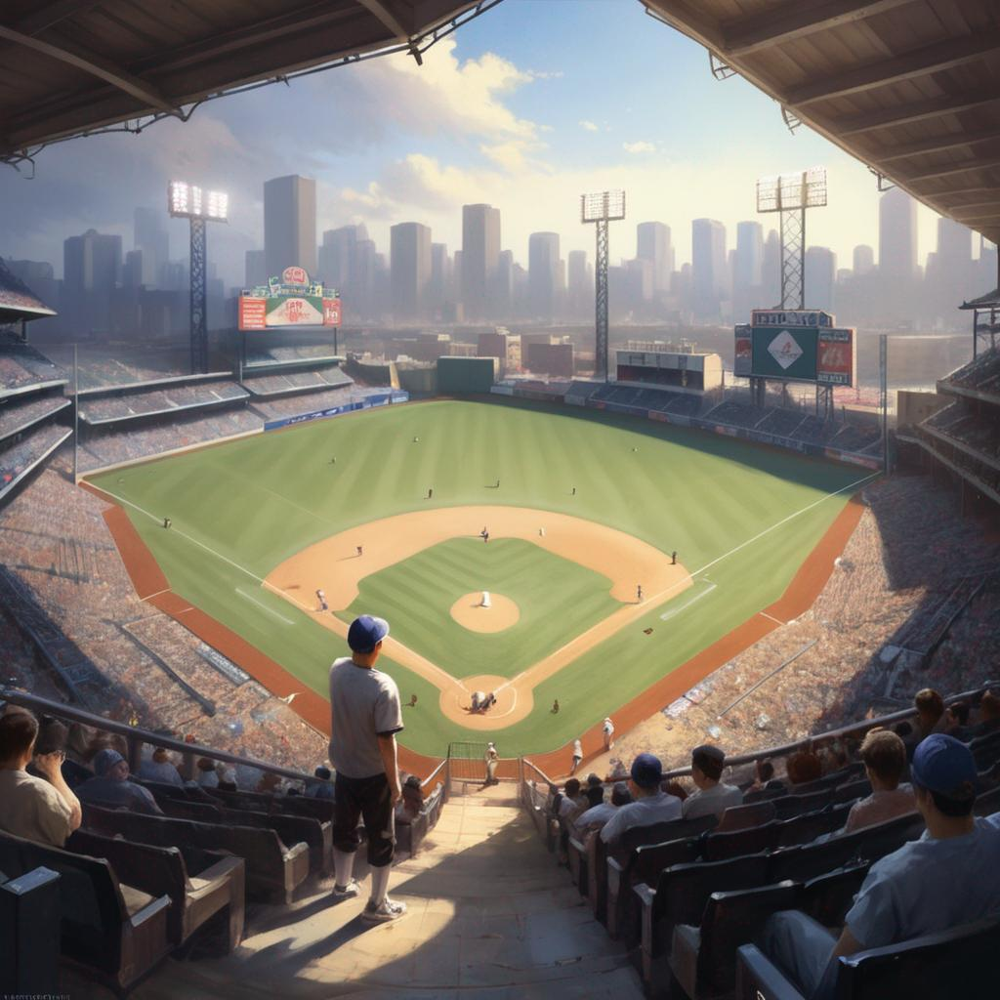


Sample 6 (Index 1233)
--------------------------------------------------
INPUT (Query): OCR the image
--------------------------------------------------
ACTUAL OUTPUT: ['The OCR extracted text from the image is:\n\n13504', 'The image shows two different pieces of a black and grey rock. One of the rocks has a crack or break in it, while the other is a monochrome photo of the whole rock. The monochrome photo is taken in black and white. There is also a large amount of gray material in the image, which seems to have been photographed in a black and white format.']
--------------------------------------------------
GENERATED OUTPUT: is a close-up of a piece of wood with blue writing on it.
--------------------------------------------------


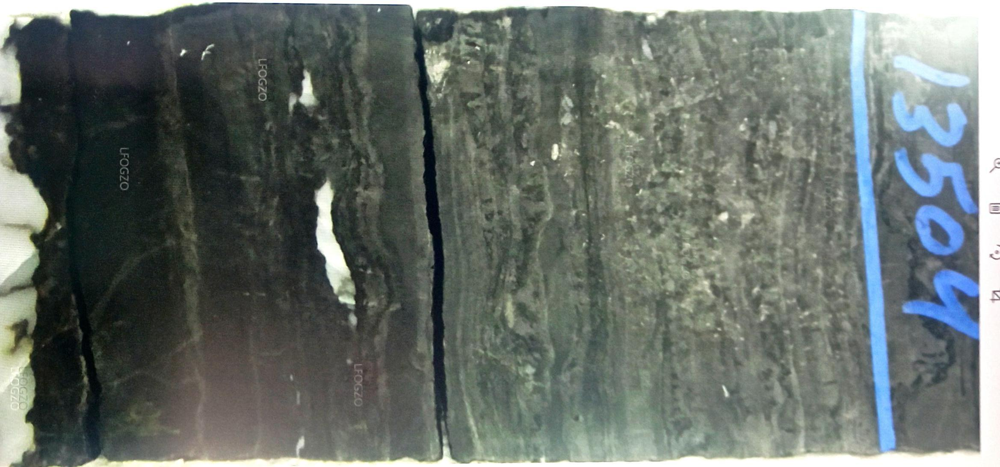


Sample 7 (Index 1069)
--------------------------------------------------
INPUT (Query): The bottom of the image shows a phrase of an activity. List steps in detail to initiate this activity and key factors to succeed.
--------------------------------------------------
ACTUAL OUTPUT: ['Payday loan business', 'To initiate the activity of Payday Loan Business, one should follow these steps:1. Research: Conduct thorough research on the payday loan industry, including market trends, competition, target audience, and regulations. This will help in understanding the potential opportunities and challenges in the market.2. Develop a Business Plan: Create a comprehensive business plan that outlines the goals, objectives, target market, marketing strategies, financial projections, and operational procedures of the payday loan business.3. Obtain Necessary Licenses and Permits: Ensure that all required licenses and permits are obtained from the relevant authorities, such as the state attorney gene

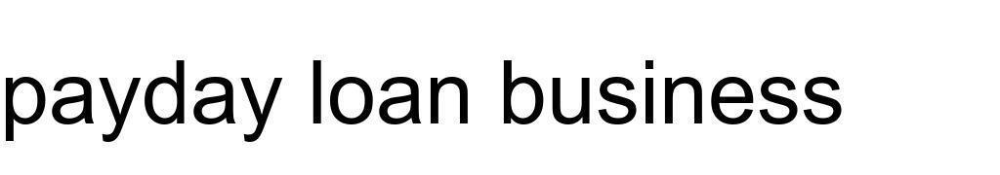


Sample 8 (Index 1179)
--------------------------------------------------
INPUT (Query): list and translate the text in the image.
--------------------------------------------------
ACTUAL OUTPUT: ['中文文本: 你是一条酸菜鱼\n              又酸又菜又多余\n\n翻译成英文: You are a pickled cabbage fish\n              Also sour, also weak, also redundant', 'Please provide me with the list and translation of the text in the image.']
--------------------------------------------------
GENERATED OUTPUT: a panda is holding a bowl of noodles with chinese writing
--------------------------------------------------


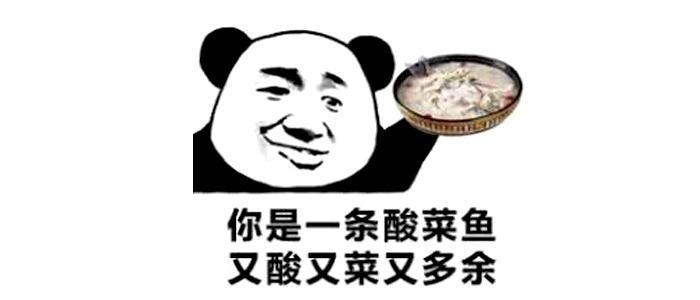


Sample 9 (Index 1090)
--------------------------------------------------
INPUT (Query): What is portrayed on this image?
--------------------------------------------------
ACTUAL OUTPUT: ['A helicopter with a human face and a lot of arms and legs.', "The image appears to be a digital drawing or illustration of a creature that combines elements of a human and a fish. It has a human-like face with eyes, eyebrows, and a nose, but the body is elongated and segmented like a fish, with what looks like gills or fins on the sides. The creature also has a tail that resembles a fish's tail. The style of the drawing is somewhat abstract and whimsical, with a limited color palette that gives it a sketch-like quality."]
--------------------------------------------------
GENERATED OUTPUT: The image portrays a cartoon-like creature with a helicopter on its head, flying in the air.
--------------------------------------------------


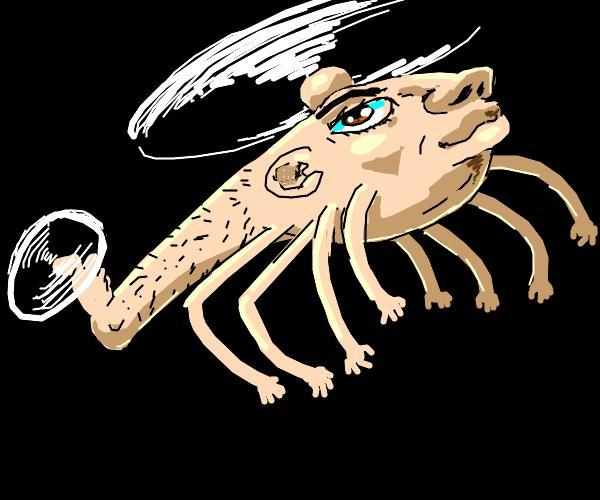


Sample 10 (Index 1199)
--------------------------------------------------
INPUT (Query): What is unusual about the boy's attire?
--------------------------------------------------
ACTUAL OUTPUT: ['The boy is wearing a pleated skirt.', "The boy's attire is unusual because he is wearing a white sleeveless top paired with a pleated black skirt, typically associated with female clothing.</s>"]
--------------------------------------------------
GENERATED OUTPUT: The boy's attire in the painting is unusual because he is wearing a skirt, which is typically associated with women's clothing. In the image, he is wearing a white tank top, a black skirt, and black shoes. The combination of a skirt with a tank top and shoes creates a unique and unconventional outfit for a young boy.
--------------------------------------------------


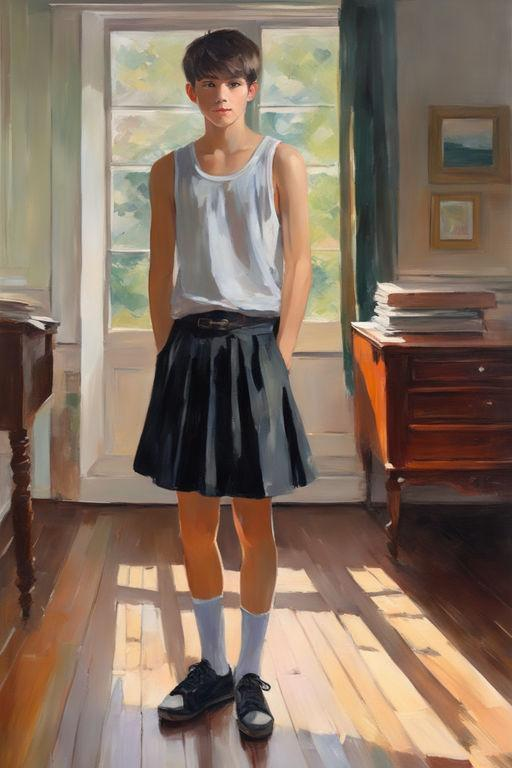

In [8]:
import random

# --- Random Sample Inference (10 random samples between 1001 and 1250) ---
print("\nRunning inference on 10 random samples between 1001 and 1250...")

# Randomly select 10 unique indices between 1001 and 1250
indices = random.sample(range(1001, 1250), 10)

for i, idx in enumerate(indices):
    sample = dataset[idx]
    image = sample['image']
    query = sample['query']
    actual_response = sample['response']

    inputs = processor(
        images=image,
        text=query,
        return_tensors="pt",
    ).to(device, torch.float16)

    if 'qformer_input_ids' not in inputs:
        inputs['qformer_input_ids'] = inputs.input_ids.clone()
    if 'qformer_attention_mask' not in inputs:
        inputs['qformer_attention_mask'] = inputs.attention_mask.clone()

    with torch.no_grad():
        generated_ids = model.generate(
            pixel_values=inputs.pixel_values,
            input_ids=inputs.input_ids,
            attention_mask=inputs.attention_mask,
            qformer_input_ids=inputs.qformer_input_ids,
            qformer_attention_mask=inputs.qformer_attention_mask,
            max_new_tokens=128,
            num_beams=3,
            do_sample=False,
        )

    input_length = inputs.input_ids.shape[1]
    generated_ids_only = generated_ids[:, input_length:]
    generated_text = processor.batch_decode(generated_ids_only, skip_special_tokens=True)[0].strip()

    print(f"\nSample {i+1} (Index {idx})")
    print("-" * 50)
    print(f"INPUT (Query): {query}")
    print("-" * 50)
    print(f"ACTUAL OUTPUT: {actual_response}")
    print("-" * 50)
    print(f"GENERATED OUTPUT: {generated_text}")
    print("-" * 50)

    if isinstance(image, Image.Image):
        display(image)
    elif hasattr(image, 'numpy'):
        display(Image.fromarray(image.numpy()))
    else:
        print("Image format not recognized.")


In [9]:

# --- Compute Additional Evaluation Metrics (ROUGE and CLIP Score) ---

# Collect predictions for evaluation metrics.
all_generated_texts = []
all_actual_texts = []
all_images = []

print("\nCollecting predictions for evaluation metrics...")
for idx in tqdm(range(start_idx, total_samples), desc="Collecting predictions"):
    sample = dataset[idx]
    image = sample['image']
    query = sample['query']
    actual_response = sample['response']
    if isinstance(actual_response, list):
        actual_response = actual_response[0]

    inputs = processor(
        images=image,
        text=query,
        return_tensors="pt",
        padding="max_length",
        truncation=True,
        max_length=512,
    ).to(device, torch.float16)

    if 'qformer_input_ids' not in inputs:
        inputs['qformer_input_ids'] = inputs.input_ids.clone()
    if 'qformer_attention_mask' not in inputs:
        inputs['qformer_attention_mask'] = inputs.attention_mask.clone()

    with torch.no_grad():
        generated_ids = model.generate(
            pixel_values=inputs.pixel_values,
            input_ids=inputs.input_ids,
            attention_mask=inputs.attention_mask,
            qformer_input_ids=inputs.qformer_input_ids,
            qformer_attention_mask=inputs.qformer_attention_mask,
            max_new_tokens=128,
            num_beams=3,
            do_sample=False,
        )
    input_length = inputs.input_ids.shape[1]
    generated_ids_only = generated_ids[:, input_length:]
    generated_text = processor.batch_decode(generated_ids_only, skip_special_tokens=True)[0].strip()

    all_generated_texts.append(generated_text)
    all_actual_texts.append(actual_response)
    all_images.append(image)

# Compute ROUGE Score using Evaluate.
try:
    rouge_metric = evaluate.load("rouge")
    rouge_result = rouge_metric.compute(predictions=all_generated_texts, references=all_actual_texts)
    print("\nROUGE Evaluation Results:")
    print("ROUGE-1:", rouge_result["rouge1"])
    print("ROUGE-2:", rouge_result["rouge2"])
    print("ROUGE-L:", rouge_result["rougeL"])
except Exception as e:
    print("Error loading or computing ROUGE metric:", e)

# --- Compute CLIP Score using a Custom Function ---
from transformers import CLIPProcessor, CLIPModel

clip_model = CLIPModel.from_pretrained("openai/clip-vit-base-patch32").to(device)
clip_processor = CLIPProcessor.from_pretrained("openai/clip-vit-base-patch32")
clip_tokenizer = clip_processor.tokenizer  # Needed for manual truncation

def truncate_caption(caption, max_tokens=77):
    tokens = clip_tokenizer.encode(caption, truncation=True, max_length=max_tokens, add_special_tokens=True)
    return clip_tokenizer.decode(tokens, skip_special_tokens=True)

def compute_clip_score(image, caption):
    caption = truncate_caption(caption)  # Ensure safe length
    inputs = clip_processor(text=[caption], images=image, return_tensors="pt", padding=True).to(device)
    with torch.no_grad():
        outputs = clip_model(**inputs)
        # Normalize embeddings
        image_embeds = outputs.image_embeds / outputs.image_embeds.norm(dim=-1, keepdim=True)
        text_embeds = outputs.text_embeds / outputs.text_embeds.norm(dim=-1, keepdim=True)
        # Cosine similarity
        score = (image_embeds @ text_embeds.T).item()
    return score

clip_scores = []
for img, caption in zip(all_images, all_generated_texts):
    try:
        score = compute_clip_score(img, caption)
        clip_scores.append(score)
    except Exception as e:
        print("Error computing CLIP score for a sample:", e)

if clip_scores:
    avg_clip_score = sum(clip_scores) / len(clip_scores)
    print("\nCLIP Score Evaluation Results:")
    print("Average CLIP Score:", avg_clip_score)
else:
    print("CLIP Score could not be computed for the test samples.")


ROUGE Evaluation Results:
ROUGE-1: 0.22848719853288724
ROUGE-2: 0.10387720815491992
ROUGE-L: 0.19241488942175877


config.json:   0%|          | 0.00/4.19k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/605M [00:00<?, ?B/s]

Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


preprocessor_config.json:   0%|          | 0.00/316 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/605M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/592 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/862k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/2.22M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/389 [00:00<?, ?B/s]

Token indices sequence length is longer than the specified maximum sequence length for this model (78 > 77). Running this sequence through the model will result in indexing errors


Error computing CLIP score for a sample: Sequence length must be less than max_position_embeddings (got `sequence length`: 78 and max_position_embeddings: 77

CLIP Score Evaluation Results:
Average CLIP Score: 0.265731024105222


In [10]:
print("\n🧾 InstructBLIP Evaluation Summary")
print(f"Total Samples Evaluated: {num_samples}")
print(f"Average Loss: {average_loss:.4f}")

print("\n📊 ROUGE Evaluation Results:")
if 'rouge_result' in locals():
    print(f"ROUGE-1: {rouge_result['rouge1']:.4f}")
    print(f"ROUGE-2: {rouge_result['rouge2']:.4f}")
    print(f"ROUGE-L: {rouge_result['rougeL']:.4f}")
else:
    print("ROUGE scores not available.")

print("\n🖼️ CLIP Score Evaluation:")
if clip_scores:
    print(f"Average CLIP Score: {avg_clip_score:.4f}")
else:
    print("CLIP scores not available.")



🧾 InstructBLIP Evaluation Summary
Total Samples Evaluated: 249
Average Loss: 5.6740

📊 ROUGE Evaluation Results:
ROUGE-1: 0.2285
ROUGE-2: 0.1039
ROUGE-L: 0.1924

🖼️ CLIP Score Evaluation:
Average CLIP Score: 0.2657
